## Кратко в предыдущих сериях

Советуем перед семинаром освежить в памяти из курса статистики:

* описательные статистики (среднее, частоту абсолютную и относительную, выборочную медиану и квантили, их поиск с помощью пакета `numpy`);
* ЦПТ;
* точечные и интервальные оценки;
* оценки параметров среднего и пропорции;
* визуализации с помощью `matplotlib` и `seaborn`;
* работу с датасетами в `pandas`.

# Тема 2. Как правильно доносить информацию

## 0. Цель и задачи

**Цель** — имея готовые инсайты из исследования, научиться визуализировать и презентовать их так, чтобы в продукт были внесены изменения.

**Задачи:**

- потренироваться с выбором визуализации;
- улучшить визуализацию;
- ознакомиться с интерактивными визуализациями с помощью `plotly` и `dash`;
- изучить метод донесения информации с помощью фреймворка STAR, опробовать его на практике.

## 1. Вспомним, что было на лекции про визуализации

### Вопрос в зал: какие основные принципы хорошей визуализации?

Студенты перечисляют список с лекции.
- **Графическая целостность и честность визуализации:** масштабы правильные, оси верны, подписи понятны, не было «подгона» данных.
- **Соотношение данных и чернил:** визуализация не перегружена, понятна, из неё легко сделать выводы.
- **Многофункциональность графических элементов:** график читается без пояснений, тренды и закономерности легко видны.

## 2. Улучшаем визуализации

### 2.1 Какая визуализация лучше


На восприятие работы влияет качество визуализации результатов. Плохая структура или неподходящий формат убьют все попытки качественной аналитики.

#### 0.1 Без комментариев

<img src="trump.png" width="400">
- ❌ Плохо: явная «нечестность» визуализации.

#### 0.2 Угадайте, по какой логике отсортированы столбцы

![image-9.png](attachment:image-9.png)


#### 1. Дискотека цветов
**Гистограммы продаж**  
![image.png](attachment:image.png)
- ❌ *Плохая:* визуализация перегружена. Хаотичные цвета, неполные подписи, сложность сравнения.
- ✅ *Хорошая:* единая цветовая гамма, подписи на все года, акцент на важные данные.

#### 2. Что с масштабом? 😨
**Среднее число лайков**  
![image-2.png](attachment:image-2.png)
- ❌ *Плохая:* масштаб и абсолютные значения искажают восприятие, непонятно, что означают цвета.
- ✅ *Хорошая:* пропорциональный масштаб, удобные числовые обозначения, чёткий акцент.

#### 3. Зачем столько информации?
![image-7.png](attachment:image-7.png)

 **Гос. расходы на пенсии**
![image-3.png](attachment:image-3.png)
- ❌ *Плохая:* перегруженность, плохо читаемые точки.
- ✅ *Хорошая:* оптимизированный размер и цвет точек, логичный масштаб.

#### 4. Качаемся на качелях
**Опрос по Brexit**
![image-8.png](attachment:image-8.png)
- ❌ *Плохая:* резкие линии, мешающие увидеть тренд.
- ✅ *Хорошая:* сглаженные тренды, точки данных, чёткая цветовая кодировка.


***Итого***

Хорошие визуализации делают данные понятными, убирают лишний шум и подчёркивают ключевые моменты.


- **Плохая визуализация**: график с перегруженной информацией, трудно читаемые цвета, отсутствие подписей.  
- **Хорошая визуализация**: чётко передает инсайт, легко воспринимается, помогает найти закономерности.  

> **Ключевая мысль:** графики — это инструмент для быстрого понимания данных и донесения мысли. Они помогают находить тренды, закономерности и аномалии.

<img src="mem viz.png" width="400">

### 2.2 Что не так? Как лучше?

- ![image.png](attachment:image.png)
- ![image-2.png](attachment:image-2.png)
- ![image-3.png](attachment:image-3.png)

### 2.2. Кейс на улучшение визуализации

In [ ]:
import matplotlib.pyplot as plt
import scipy.stats as sps
import numpy as np
import seaborn as sns
import pandas as pd
sns.set_theme(style='whitegrid')

**Загрузка данных**

Используем датасет **Titanic**, встроенный в Seaborn.

In [ ]:
# Загружаем данные
df = sns.load_dataset('titanic')
df.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True


#### **Описание датасета Titanic**  

Этот датасет содержит информацию о пассажирах печально известного лайнера «Титаник», который затонул в 1912 году.  
Данные включают характеристики пассажиров, такие как их возраст, пол, класс каюты, а также информацию о выживании.

**Описание столбцов:**

| Колонка      | Тип данных  | Описание |
|--------------|------------|----------|
| **survived** | `int (0/1)` | Выжил ли пассажир (0 = нет, 1 = да) |
| **pclass**   | `int` | Класс каюты пассажира (1 = первый, 2 = второй, 3 = третий) |
| **sex**      | `object` | Пол пассажира (`male` или `female`) |
| **age**      | `float` | Возраст пассажира в годах |
| **sibsp**    | `int` | Количество братьев/сестёр или супругов на борту |
| **parch**    | `int` | Количество родителей/детей на борту |
| **fare**     | `float` | Стоимость билета |
| **embarked** | `object` | Порт посадки (`C` = Cherbourg, `Q` = Queenstown, `S` = Southampton) |
| **class**    | `object` | Альтернативное обозначение класса каюты (`First`, `Second`, `Third`) |
| **who**      | `object` | Категория пассажира (`man`, `woman`, `child`) |
| **adult_male** | `bool` | Является ли пассажир взрослым мужчиной (True/False) |
| **deck**     | `object` | Буква палубы каюты (`A`, `B`, `C` и т. д.) |
| **embark_town** | `object` | Название города, где пассажир сел на борт |
| **alive**    | `object` | Выжил ли пассажир (`yes`/`no`) |
| **alone**    | `bool` | Путешествовал ли пассажир в одиночку (True/False) |


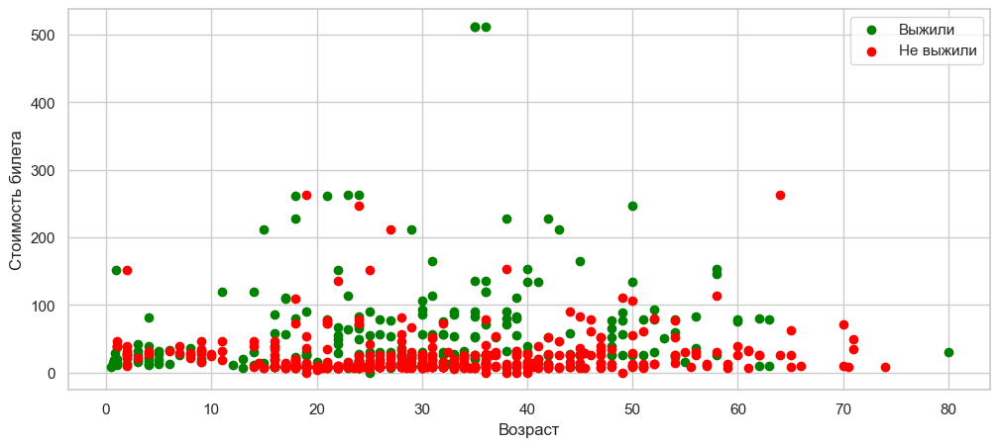

In [ ]:
df_0 = df[df['survived'] == 0]
df_1 = df[df['survived'] == 1]

plt.figure(figsize=(12, 5))
plt.scatter(x=df_1['age'], y=df_1['fare'], c='green', label='Выжили')
plt.scatter(x=df_0['age'], y=df_0['fare'], c='red', label='Не выжили')
plt.xlabel('Возраст')
plt.ylabel('Стоимость билета')
plt.legend()
plt.show()

#### Дорабатываем график.

- Что не так с графиком?
- Доработайте график.
- Сделайте вывод о зависимости возраста и стоимости билета.

*Что не так?*
- Слишком много больших и жирных точек, которые накладываются друг на друга.
- Непонятна зависимость: кажется, что точки хаотичны.
- Можно увеличить масштаб.

In [ ]:
df['group_age'] = df['age'] // 5

df['group_age'] = df['group_age'].apply(lambda group: 14. if group > 11 else group)
df['group_age'] *= 5
df['group_age'] += 2.5
df_groupby_age = df.groupby(['group_age', 'survived'])['fare'].median().reset_index()
df_groupby_age.head(5)

,group_age,survived,fare
0,2.5,0,29.125
1,2.5,1,20.575
2,7.5,0,31.275
3,7.5,1,26.250
4,12.5,0,27.900


**Хорошая визуализация**

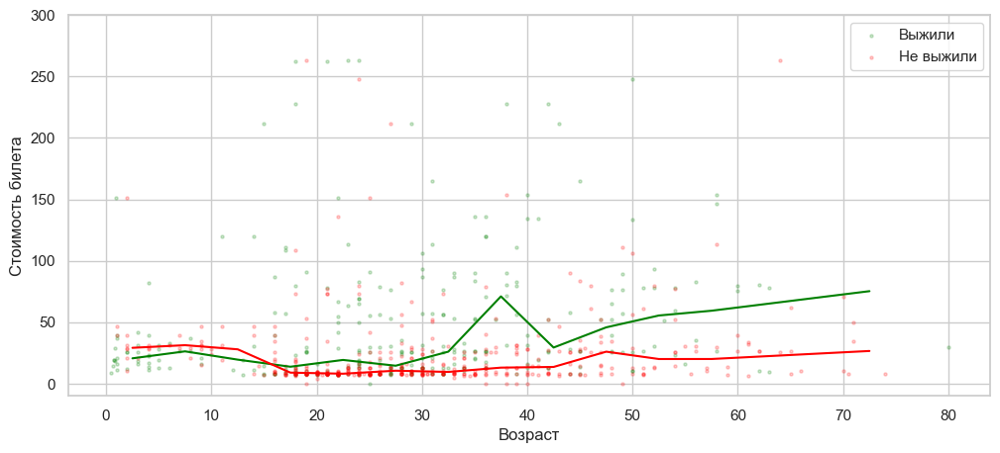

In [ ]:
df_groupby_age_0 = df_groupby_age[df_groupby_age['survived'] == 0]
df_groupby_age_1 = df_groupby_age[df_groupby_age['survived'] == 1]

plt.figure(figsize=(12, 5))
plt.scatter(x=df_1['age'], y=df_1['fare'], c='green', s=5, label='Выжили', alpha=0.2)
plt.scatter(x=df_0['age'], y=df_0['fare'], c='red', s=5, label='Не выжили', alpha=0.2)
plt.plot(df_groupby_age_1['group_age'], df_groupby_age_1['fare'], c='green')
plt.plot(df_groupby_age_0['group_age'], df_groupby_age_0['fare'], c='red')
plt.ylim((-10, 300))
plt.xlabel('Возраст')
plt.ylabel('Стоимость билета')
plt.legend()
plt.show()

## 3. Интерактивные графики в Plotly и Dash

### 3.1 Основы Plotly: создание интерактивных графиков

In [ ]:
import plotly.io as pio
import plotly.graph_objects as go
import plotly.express as px
pio.renderers.default='notebook'

**Линейный график**

In [ ]:
df_groupby_age['alone'] = df.groupby(['group_age', 'survived'])['alone'].mean().to_numpy()
df_groupby_age['cnt'] = df.groupby(['group_age', 'survived'])['alone'].count().to_numpy()

df_groupby_age.head(5)

,group_age,survived,fare,alone,cnt
0,2.5,0,29.125,0.000000,13
1,2.5,1,20.575,0.000000,27
2,7.5,0,31.275,0.000000,11
3,7.5,1,26.250,0.090909,11
4,12.5,0,27.900,0.222222,9


In [ ]:
# Создание фигуры
fig = go.Figure()

survived = df_groupby_age[df_groupby_age['survived'] == 1]
not_survived = df_groupby_age[df_groupby_age['survived'] == 0]
fig.add_scatter(x=not_survived['group_age'], y=not_survived['alone'], mode='lines', marker_color='red',
                name='no')
fig.add_scatter(x=survived['group_age'], y=survived['alone'], mode='lines', marker_color='green', name='yes')

# Настройка осей и заголовка
fig.update_layout(title="Зависимость доли одиночек от возраста",
                  xaxis_title="возраст", yaxis_title="доля одиночек")

# Отображение
fig.show()
fig.write_html('linear.html')

Улучшим график, добавив доверительные интервалы по ЦПТ.

In [ ]:
alpha = 0.95
z = sps.norm.ppf((1 + alpha) / 2)

# Создание фигуры
fig = go.Figure()

survived = df_groupby_age[df_groupby_age['survived'] == 1]
not_survived = df_groupby_age[df_groupby_age['survived'] == 0]

y = not_survived['alone']
std = np.sqrt(y * (1 - y))
n = not_survived['cnt']

fig.add_scatter(x=not_survived['group_age'], y=y, mode='lines', marker_color='red',
                name='no')
fig.add_traces([go.Scatter(x=not_survived['group_age'], y=np.maximum(0, y - z * std / np.sqrt(n)),
                           mode='lines', line_color = 'rgba(0,0,0,0)',
                           showlegend=False),
                go.Scatter(x=not_survived['group_age'], y=np.minimum(1, y + z * std / np.sqrt(n)),
                           mode='lines', line_color='rgba(0,0,0,0)', name='95% confidence interval',
                           fill='tonexty', fillcolor = 'rgba(255, 0, 0, 0.2)',
                           showlegend=False)])
y = survived['alone']
std = np.sqrt(y * (1 - y))
n = survived['cnt']

fig.add_scatter(x=survived['group_age'], y=y, mode='lines', marker_color='green', name='yes')

fig.add_traces([go.Scatter(x=survived['group_age'], y=np.maximum(0, y - z * std / np.sqrt(n)),
                           mode='lines', line_color='rgba(0,0,0,0)',
                           showlegend=False),
                go.Scatter(x=survived['group_age'], y=np.minimum(1, y + z * std / np.sqrt(n)),
                           mode='lines', line_color='rgba(0,0,0,0)', name='95% confidence interval',
                           fill='tonexty', fillcolor='rgba(0, 255, 0, 0.2)',
                           showlegend=False)])

# Настройка осей и заголовка
fig.update_layout(title="Зависимость доли одиночек от возраста",
                  xaxis_title="возраст", yaxis_title="доля одиночек")

# Отображение
fig.show()
fig.write_html('linear_conf_int.html')

**Выводы**
* Выжившие незначимо чаще были не одни.
* Ожидаемо несовершеннолетние редко бывали одни на корабле. После 20 лет различия незаметны.

**Столбчатая диаграмма**

Способ 1

In [ ]:
df_groupby_pclass = df.groupby('pclass')['fare'].mean().reset_index()

# Создание столбчатого графика
fig = px.bar(df_groupby_pclass, x='pclass', y='fare', title='Диаграмма цены от класса')

fig.update_layout(xaxis=dict(tickmode='linear', tick0=1, dtick=1), xaxis_title="класс", yaxis_title="цена")

fig.show()
fig.write_html('bar_1.html')

Способ 2

In [ ]:
df_groupby_pclass = df.groupby('pclass')['fare'].mean().reset_index()

# Создание столбчатого графика
fig = px.histogram(df, x='pclass', y='fare', histfunc='avg', title='Диаграмма цены от класса')

fig.update_layout(xaxis=dict(tickmode='linear', tick0=1, dtick=1), xaxis_title="класс", yaxis_title="цена",
                  bargap=0.2)


fig.show()
fig.write_html('bar_2.html')

#### Практика: постройте гистограмму распределения возраста в зависимости от выживания и сделайте вывод.

Способ 1

In [ ]:
# График выживаемости по классам обслуживания
df_groupby_pclass_sex = df.groupby(['pclass', 'sex'])['survived'].mean().reset_index()


fig_bar = px.bar(df_groupby_pclass_sex, x='pclass', y='survived', color='sex', barmode='group',
                 title='Выживаемость по классам')

fig_bar.update_layout(xaxis_title="класс", yaxis_title="доля выживших")

fig_bar.show()
fig_bar.write_html('bar_divided_1.html')

Способ 2

In [ ]:
fig_bar = px.histogram(df, x='pclass', y='survived', color='sex', barmode='group', histfunc='avg',
                 title='Выживаемость по классам')
fig_bar.update_layout(xaxis_title="класс", yaxis_title="доля выживших")

fig_bar.show()
fig_bar.write_html('bar_divided_2.html')

**Выводы**
- Доля выживших женщин значительно больше, чем доля выживших мужчин. Это подтверждает тезис, что сначала спасали женщин и детей.
- Вероятность выжить у пассажиров 1 и 2 класса значительно больше, чем у пассажиров классом ниже.

### Waterfall-графики

Водопадные графики используются чаще всего для анализа итоговой прибыли компании: выявляются главные источники доходов и расходов и находятся сильные и слабые места в экономики продукта

**Вернемся к кейсу с Yxxxxx.Такси**

Построим waterfall-график экономики сервиса в месяц. Для этого нам нужны дополнительно данные о расходах.

- Аренда авто компанией: 15 000 ₽ в месяц за «Эконом», 20 000 ₽ в месяц за «Комфорт» и 25 000 ₽ в месяц за «Комфорт+».
- Аренда парковки: 5 000 ₽ в месяц за одно парковочное место.
- Ремонт автомобилей: 5 млн ₽ в месяц суммарно.
- Бонусные выплаты водителям: 20 000 ₽ единоразово за 250 заказов в месяц.
- Аренда офиса для IT: 2 млн ₽ в месяц.
- Зарплата IT-специалистов: 7 млн ₽ в месяц суммарно.
- Затраты на рекламу: 7 млн ₽ в месяц суммарно.
- Прочие затраты: 5 млн ₽ в месяц суммарно.

**Посчитаем нужные нам величины и отобразим их на графике.**

In [ ]:
df = pd.read_csv('orders_group.csv')
df

,taxist_id,date,orders_cnt,total_cost,total_service_fee,auto_id,tariff,rent_cost,driver_income,company_income
0,1,2024-09-01,12,8674,1734.8,1494,эконом,1200,5739.2,2934.8
1,1,2024-09-02,10,8136,1627.2,1494,эконом,1200,5308.8,2827.2
2,1,2024-09-03,9,6361,1272.2,1494,эконом,1200,3888.8,2472.2
3,1,2024-09-04,13,9576,1915.2,1494,эконом,1200,6460.8,3115.2
4,1,2024-09-05,7,3664,732.8,1494,эконом,1200,1731.2,1932.8
...,...,...,...,...,...,...,...,...,...,...
32909,1609,2024-09-19,14,21130,4226.0,565,комфорт,2400,14504.0,6626.0
32910,1609,2024-09-22,8,10786,2157.2,565,комфорт,2400,6228.8,4557.2
32911,1609,2024-09-24,13,15341,3068.2,565,комфорт,2400,9872.8,5468.2
32912,1609,2024-09-25,8,6322,1264.4,565,комфорт,2400,2657.6,3664.4


In [ ]:
# Доходы сервиса
df_group = df.groupby('tariff')[[
    'orders_cnt', 'total_cost', 'total_service_fee',
    'rent_cost', 'driver_income', 'company_income'
]].sum().reset_index()
df_group
total_fee_income = df_group['total_service_fee'].sum()
total_rent_income = df_group['rent_cost'].sum()
total_fee_income, total_rent_income

(56265065.0, 61822450)

In [ ]:
# Расходы сервиса на авто

c_auto_econom = 15_000
c_auto_comfort = 20_000
c_auto_comfort_plus = 25_000
c_parking_per_one = 5_000
c_repair = 5_000_000

cars = pd.read_csv('cars_clean.csv')
cars['rent_company_cost'] = cars['tariff'].apply(
    lambda t: c_auto_econom if t == 'эконом' else \
    c_auto_comfort if t == 'комфорт' else c_auto_comfort_plus)
cars['parking_cost'] = c_parking_per_one
cars_costs = cars.groupby('tariff')[['rent_company_cost', 'parking_cost']].sum()
total_rent_company_cost = -cars_costs['rent_company_cost'].sum()
total_parking_cost = -cars_costs['parking_cost'].sum()
total_repair_cost = -c_repair
total_rent_company_cost, total_parking_cost, total_repair_cost

(-32815000, -9065000, -5000000)

In [ ]:
# Расходы сервиса на бонусы водителям

cnt_orders_bonus = 250
bonus_amt = 20_000

df_driver = df.groupby('taxist_id')[['orders_cnt']].sum()
df_driver['bonus'] = df_driver['orders_cnt'].apply(
    lambda cnt: 0 if cnt < cnt_orders_bonus else bonus_amt
)
total_drivers_bonuses_costs = -df_driver['bonus'].sum()
total_drivers_bonuses_costs

-3620000

In [ ]:
# Остальные расходы сервиса

total_office_cost = -2_000_000
total_it_salary_cost = -7_000_000
total_ad_costs = -7_000_000
total_another_costs = -5_000_000

**Построим waterfall-график**

In [ ]:
# Исходные значения
values = [
    total_fee_income,
    total_rent_income,
    total_rent_company_cost,
    total_parking_cost,
    total_repair_cost,
    total_drivers_bonuses_costs,
    total_office_cost,
    total_it_salary_cost,
    total_ad_costs,
    total_another_costs,
    0  # total, Plotly считает сам
]
values = np.round(values, -5)

fig = go.Figure(go.Waterfall(
    name = "2024",
    orientation = "v",
    measure = [
        "relative", # Доход комиссии
        "relative", # Доход от аренды авто
        "relative", # Расходы на аренду авто
        "relative", # Расходы на парковку
        "relative", # Расходы на ремонт
        "relative", # Расходы на бонусы водителям
        "relative", # Расходы на офис
        "relative", # Расходы на IT-зарплату
        "relative", # Расходы на рекламу
        "relative", # Прочие расходы
        "total"     # Итог
    ],
    x = [
        "Доход: комиссия",
        "Доход: аренда авто",
        "Расход: аренда авто",
        "Расход: парковка",
        "Расход: ремонт авто",
        "Расход: бонусы водителям",
        "Расход: офис",
        "Расход: IT зарплата",
        "Расход: реклама",
        "Расход: прочие",
        "Итоговая прибыль"
    ],
    textposition = "outside",
    y = values,
#     text = text_labels,  # ← Добавляем подписи
    connector = {"line":{"color":"rgb(63, 63, 63)"}},
    increasing = {"marker":{"color":"green"}},
    decreasing = {"marker":{"color":"red"}},
    totals = {"marker":{"color":"blue"}},
))

fig.update_layout(
    title = "Waterfall: экономика сервиса за месяц",
    waterfallgap = 0.3,
)

fig.show()
fig.write_html("economics.html") # Сохраняем в HTML

### Heatmap-графики

Heatmap используются для анализа совместного распределения двух признаков. С помощью тепловых карт можно выявить корреляцию между признаками, оценить совместное распределение и разбить данные на сегменты. Обычно heatmap строят, когда хотят найти зависимости ключевых метрик друг от друга или для первичного анализа данных.

In [ ]:
orders = pd.read_csv('orders_clean.csv')
orders

,id,data,taxist,client,r1,r2,tariff,len,time,coef,cost,auto,service_fee
0,1,2024-09-16,151.0,1.0,NaN,5.0,эконом,10.0000,19.00,1.09,293,443,58.6
1,2,2024-09-08,511.0,1.0,NaN,5.0,эконом,11.7000,22.00,0.92,286,1479,57.2
2,3,2024-09-14,632.0,1.0,NaN,5.0,эконом,14.1600,18.14,1.27,387,717,77.4
3,4,2024-09-03,1439.0,2.0,NaN,5.0,комфорт,27.6000,45.00,1.37,1597,1241,319.4
4,5,2024-09-19,292.0,2.0,5.0,NaN,комфорт,44.6000,72.33,0.92,1737,1646,347.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
341304,341305,2024-09-21,1288.0,97566.0,NaN,5.0,комфорт,37.8600,65.30,1.21,2010,245,402.0
341305,341306,2024-09-17,1421.0,97567.0,5.0,5.0,эконом,59.8000,84.50,1.10,1494,1094,298.8
341306,341307,2024-09-09,680.0,97567.0,NaN,5.0,эконом,20.2400,40.20,1.28,722,1759,144.4
341307,341308,2024-09-01,1039.0,97567.0,NaN,5.0,эконом,6.0000,9.00,1.30,179,325,35.8


In [ ]:
orders_small = orders[orders['cost'] < 1_500]

fig = px.density_heatmap(
    orders_small,
    x="len",
    y="cost",
    nbinsx=30,
    nbinsy=30,
    marginal_x="histogram",  # Маргинальный график по X
    marginal_y="histogram",  # Маргинальный график по Y
)

fig.update_layout(
    title="Heatmap с маргинальными распределениями: Длина поездки vs стоимость"
)

fig.show()

## 3.2 Введение в Dash

#### Интерактивный график с карт

In [ ]:
# Загружаем датасет с данными цен квартир (запусти, если выполняешь впервые)
df = pd.read_csv('input_data.csv', sep=';', decimal=',')
df['geo_lat'] = df['geo_lat'].astype('float')
df['geo_lon'] = df['geo_lon'].astype('float')

# Загружаем датасет с регионами
regions = pd.read_excel('regions.xlsx')
regions['id_region'] = regions['GNINMB,C,4'] // 100
regions['name_region'] = regions['NAME,C,40']

In [ ]:
import dash
from dash import dcc, html, Input, Output


# Функция для агрегации данных по количеству комнат
def aggregate_data(rooms=None):
    filtered_df = df if rooms is None else df[df['rooms'] == rooms]
    metro_summary = filtered_df.groupby("id_region").agg(
        count=("price", "count"),
        median_price=("price", "median"),
        lat=("geo_lat", "median"),
        lon=("geo_lon", "median")
    ).reset_index()
    metro_summary['cost'] = metro_summary['median_price'].apply(lambda price: f'{np.round(price / 1e6, 2)} млн.')
    return metro_summary.merge(regions[['id_region', 'name_region']], on='id_region', how='left')


# Создаём дашборд
app = dash.Dash(__name__)
app.layout = html.Div([
    html.H1("Карта цен на квартиры в России по регионам"),
    html.Label("Выберите количество комнат:"),
    dcc.Dropdown(
        id='room-filter',
        options=[
            {'label': 'Все', 'value': 'all'}
        ] + [{'label': f'{i} комн.', 'value': i} for i in sorted(df['rooms'].dropna().unique())],
        value='all',
        clearable=False
    ),
    dcc.Graph(id="russia_map")
])

@app.callback(
    Output("russia_map", "figure"),
    Input("room-filter", "value")
)
def update_map(selected_rooms):
    rooms = None if selected_rooms == 'all' else int(selected_rooms)
    metro_summary_region = aggregate_data(rooms)
    fig = px.scatter_mapbox(
        metro_summary_region,
        lat="lat",
        lon="lon",
        size="count",
        color="median_price",
        hover_name="name_region",
        title="Стоимость квартир и количество предложений по регионам России",
        color_continuous_scale="Bluered",
        size_max=20,
        center={"lat": 55, "lon": 55}, # Центрируем карту
        zoom=3,
        mapbox_style="open-street-map"
    )
    fig.write_html("map.html") # Сохраняем в HTML. Там можно будет посмотреть в полноэкранном режиме
    return fig

app.run_server(debug=True, port=8051)

## **4. Фреймворк STAR**  

### Вопрос в зал: что такое фреймворк STAR?

Фреймворк STAR (Situation, Task, Action, Result) — это метод структурированного представления информации, который помогает чётко и логично излагать идеи. В контексте визуализации данных он может использоваться для структурирования анализа, презентации выводов и объяснения методологии.

*Пример использования:* я поискал на «Хабре» информацию про фреймворк STAR и обнаружил в топе страниц следующие:
- [Как подготовиться к собеседованию в зарубежных компаниях по методике STAR и почему это не очередная выдумка HR](https://habr.com/ru/companies/netologyru/articles/691510/);
- [Как я перестал превращать собес в экзамен: оцениваем хард- и софт-скиллы за одно собеседование](https://habr.com/ru/companies/plesk/articles/552960/).

Как видите, этот фреймворк довольно популярен в подготовке и проведении собеседования.


### **Формат STAR**
1. **Situation (Ситуация):** контекст проблемы или задачи.  
2. **Task (Задача):** конкретная цель, которую нужно достичь.  
3. **Action (Действие):** шаги, предпринятые для решения задачи.  
4. **Result (Результат):** итог выполненных действий.

---

### Кейс: борьба с зависанием в соцсетях

![image-4.png](attachment:image-4.png)
- **S (Ситуация).** Я заметил, что слишком много времени провожу в соцсетях, из-за чего не успеваю делать важные дела. (рабочие задачи, учёба, домашние дела, хобби)
- **T (Задача).** Я поставил перед собой задачу понять, сколько времени уходит на соцсети и как это влияет на продуктивность.  
- **A (Действие).** Я начал отслеживать время использования телефона. Понял, что в дни зависания в соцсетях у меня не хватало времени на другие активности, и я просрачивал дедлайны или у меня не было времени на мои хобби.
- **R (Результат).** После проведённого анализа я решил поставить лимиты на использование некоторых приложений. В итоге свободного времени стало больше, а дела делаются быстрее. Правда, есть один минус: теперь SLA моих ответов стал немного больше.😅

---

![image-2.png](attachment:image-2.png)

- **S (Ситуация).** Около года назад я понял, что достаточно много трачу: несмотря на солидную зарплату накоплений практически не было.
- **T (Задача).** Я поставил перед собой цель — научиться лучше управлять своими деньгами, создать подушку безопасности и начать инвестировать, чтобы накопить на квартиру.
- **A (Действие).** Я начал с малого: завёл таблицу расходов и стал фиксировать каждую трату. Затем прошёл онлайн-курс по инвестициям, где научился разбираться в базовых инвестиционных инструментах. Также я открыл брокерский счёт и начал инвестировать небольшие суммы в индексные фонды.
- **R (Результат).** Сейчас у меня есть подушка безопасности на примерно год жизни. Не знаю, повлияла ли моя работа над финансовой грамотностью или повышение зарплаты, но теперь у меня получается откладывать. Хотелось бы сказать, что мои инвестиции принесли первые доходы, но с текущей ситуацией это сложно, так что рассматриваю инвестиции как первый опыт, на котором пытаюсь набить шишки.

## 5. ✍️ Практика: презентация результатов по STAR

Студенты разбиваются на 4 группы. Каждая группа получает ситуацию и визуализацию. Каждая группа должна додумать, что они сделали в кейсе, что получили и что предлагают изменить в продукте.

Подготовка студентов и короткое выступление по STAR.

Обратная связь от участников и семинариста.

### **Кейс 1. Проседание покупок**

**Ситуация**

В мобильном приложении для заказа еды изменили экран онбординга: теперь регистрация обязательна перед показом каталога. После обновления аналитик проверяет воронку покупок: из-за обязательной регистрации часть пользователей ушла с воронки, однако мы получили прирост в регистрациях, то есть больше информации о новых пользователях.

**Задача студентов**

Использовать фреймворк **STAR**, чтобы разобрать:

* S — почему изменился онбординг;
* T — что хотим понять (влияние на конверсию);
* A — что делаем (анализ воронки);
* R — что решаем (гипотезы про упрощение регистрации).

**График**

In [ ]:
data = dict(Quantity=[1, 0.25, 0.2, 0.12,
                      1, 0.5, 0.16, 0.10],
            Stage=['Заходы', 'Регистрации', 'Добавления в корзину', 'Оплаты']*2,
            Process=['Старый']*4 + ['Новый']*4)

fig = px.funnel(data, y='Stage', x='Quantity', color='Process',
                color_discrete_map={"Старый": "#374B53",
                                    "Новый": "#A4B7C8"},
                template="simple_white",
                title='Добавление обязательной регистрации',
                labels={"Stage": ""})
fig.show()

### **Кейс 2. Резкий рост оттока**

**Ситуация**

Подписной сервис (онлайн-курсы) запустил акцию: первый месяц подписки с большой скидкой. Retention пользователей новой акции оказался хуже, однако мы привлекли новых пользователей. Что делать?

**Задача студентов**

Использовать **STAR**, чтобы:

* S — разобрать цепочку «акция → много новых пользователей»;
* T — проверить поведение (retention, LTV);
* A — сравнить когортные графики;
* R — принять решение об изменении условий или сегментировании.

**График**

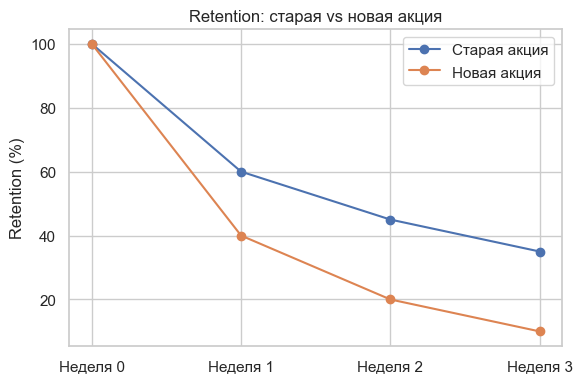

In [ ]:
weeks = ['Неделя 0', 'Неделя 1', 'Неделя 2', 'Неделя 3']
old = [100, 60, 45, 35]
new = [100, 40, 20, 10]

plt.figure(figsize=(6, 4))
plt.plot(weeks, old, marker='o', label='Старая акция')
plt.plot(weeks, new, marker='o', label='Новая акция')
plt.title('Retention: старая vs новая акция')
plt.ylabel('Retention (%)')
plt.legend()
plt.tight_layout()

### **Кейс 3. Локальное падение NPS**

**Ситуация**

Сервис доставки продуктов отслеживает NPS по городам. В одном городе NPS резко упал за неделю. Что могло пойти не так?

**Задача студентов**

Использовать **STAR**, чтобы:

* S — разобрать локальное падение;
* T — найти причину;
* A — проверить жалобы, сроки доставки, партнёров;
* R — выработать решение (замена партнёра, компенсации).

**График**

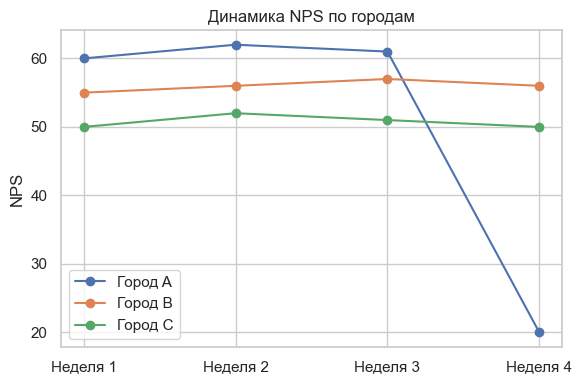

In [ ]:
weeks = ['Неделя 1', 'Неделя 2', 'Неделя 3', 'Неделя 4']
city_a = [60, 62, 61, 20]
city_b = [55, 56, 57, 56]
city_c = [50, 52, 51, 50]

plt.figure(figsize=(6, 4))
plt.plot(weeks, city_a, marker='o', label='Город A')
plt.plot(weeks, city_b, marker='o', label='Город B')
plt.plot(weeks, city_c, marker='o', label='Город C')
plt.title('Динамика NPS по городам')
plt.ylabel('NPS')
plt.legend()
plt.tight_layout()

### **Кейс 4. Тест нового сценария оплаты**

**Ситуация**

Интернет-магазин протестировал новую кнопку «Оплатить позже». Ожидали рост конверсии, но она упала.

**Задача студентов**

Использовать **STAR**, чтобы:

* S — разобрать новый сценарий оплаты;
* T — проверить эффект;
* A — провести A/B-тест и сделать анализ разницы;
* R — принять решение, откатить или улучшить сценарий.

**График**

In [ ]:
data = dict(Quantity=[1, 0.2, 0.15,
                      1, 0.23, 0.12],
            Stage=['Сессии', 'Добавления в корзину', 'Оплаты']*2,
            Process=['Старый']*3 + ['Новый']*3)

fig = px.funnel(data, y='Stage', x='Quantity', color='Process',
                color_discrete_map={"Старый": "#374B53",
                                    "Новый": "#A4B7C8"},
                template="simple_white",
                title='Новый сценарий оплаты',
                labels={"Stage": ""})
fig.show()

## 6. Итоги семинара

С чем выходим с занятия:

- повторили, как нужно и как не нужно графически изображать данные;
- научились интерактивным визуализациям с помощью `plotly` и `dash`;
- изучили фреймворк STAR;
- потренировались презентовать результаты перед заказчиком.

## 7. Полезные материалы

* [Статья с плохими визуализациями](https://www.luzmo.com/blog/bad-data-visualization)
* [Ещё одна статья про плохие визуализации](https://habr.com/ru/articles/446880/)
* [Телеграм-канал «отвратительные графики»](https://t.me/awfulcharts)
